# Welcome to the In-Silico Framework (ISF)

ISF is a multi-scale simulation environment for the generation, simulation, and analysis of neurobiologically tractable single cell and network-level simulations.

![organigram.png](../docs/_static/organigram@300x.png)

## Packages in ISF

### Packages in this repository you will most likely directly interact with

| Module |Description                                                                                                                                                                                                                                                                                                                                                                                                                                                                 |
|---------------------------|--------------------------------------------|
| [singlecell_input_mapper](../singlecell_input_mapper/__init__.py)| Module for generating anatomical models, i.e. determining number and location of synapses and number and location of presynaptic cells                                                                                                                                                                                                                                                                                                                                       |
| [single_cell_parser](../single_cell_parser/__init__.py)| High level interface to the NEURON simulator providing methods to perform single cell simulations with synaptic input. The anatomical constraints of the synaptic input are provided by the single_cell_input_mapper module.                                                                                                                                                                                                                                                |
| [simrun](../simrun/__init__.py)| High level interface to the single_cell_parser module providing methods for common simulation tasks. It also provides methods for building reduced models mimicing the full compartmental model.                                                                                                                                                                                                                                                                             |
| [data_base](../data_base/__init__.py)| Flexible database whose API mimics a python dictionary. It provides efficient and scalable methods to store and access simulation results at a terrabyte scale. It also generates metadata, indicating when the data was put in the database and the exact version of the in_silico_framework that was used at this timepoint. Simulation results from the single_cell_parser module can be imported and converted to a high performance binary format. |

### How should I interact with these packages?

The recommended way is to use the `Interface` module which provides the API necessary to perform simulation tasks.

In [1]:
import Interface as I

[ATTENTION] distributed_lock: Environment variable ISF_DISTRIBUTED_LOCK_CONFIG is not set. Falling back to default configuration.
[INFO] distributed_lock: trying to connect to distributed locking server {'type': 'redis', 'config': {'host': 'spock', 'port': 8885, 'socket_timeout': 1}}
[INFO] distributed_lock: trying to connect to distributed locking server {'type': 'redis', 'config': {'host': 'localhost', 'port': 6379, 'socket_timeout': 1}}
[INFO] distributed_lock: trying to connect to distributed locking server {'type': 'file'}
[WARNING] distributed_lock: Using file based locking. Please be careful on nfs mounts as file based locking has issues in this case.
[INFO] l5pt: Loading mechanisms:
[INFO] ISF: Current version: heads/docs+0.g846cc062.dirty
[INFO] ISF: Current pid: 4108
[ATTENTION] ISF: The source folder has uncommited changes!



[INFO] ISF: Loaded modules with __version__ attribute are:
IPython: 8.12.2, Interface: heads/docs+0.g846cc062.dirty, PIL: 10.4.0, _brotli: 1.0.9, _csv

Now, you can access the relevant packages, functions and classes directly:

In [2]:
I.scp # single_cell_parser package
I.sca # single_cell_analyzer package
I.DataBase # main class of isf_data_base
I.map_singlecell_inputs # compute anatomical model for a given cell morphology in barrel cortex 
I.simrun_run_new_simulations # default function for running single cell simulations with well constrained synaptic input
I.db_init_simrun_general.init # default method to initialize a model data base with existing simulation results
I.db_init_simrun_general.optimize # converts the data to speed optimized compressed binary format
I.synapse_activation_binning_dask # parallelized binning of synapse activation data
I.rm_get_kernel # create reduced lda model from simulation data

I.silence_stdout # context manager and decorator to silence functions
I.cache # decorator to cache functions

I.np # numpy
I.pd # pandas
I.dask # dask
I.distributed # distributed
I.sns # seaborn
# ...

<module 'seaborn' from '/home/bgmeulem/Documents/in_silico_framework/.pixi/envs/default/lib/python3.8/site-packages/seaborn/__init__.py'>

Use autocompletion of IPython to find the other modules. To view the documentation, use a questionamrk, e.g.

In [3]:
I.db_init_simrun_general.init?

Signature:
I.db_init_simrun_general.init(
    db,
    simresult_path,
    core=True,
    voltage_traces=True,
    synapse_activation=True,
    dendritic_voltage_traces=True,
    parameterfiles=True,
    spike_times=True,
    burst_times=False,
    repartition=True,
    scheduler=None,
    rewrite_in_optimized_format=True,
    dendritic_spike_times=True,
    dendritic_spike_times_threshold=-30.0,
    client=None,
    n_chunks=5000,
    dumper=<module 'data_base.isf_data_base.IO.LoaderDumper.pandas_to_parquet' from '/home/bgmeulem/Documents/in_silico_framework/data_base/isf_data_base/IO/LoaderDumper/pandas_to_parquet.py'>,
)
Docstring:
Initialize a database with simulation data.

Use this function to load simulation data generated with the simrun module 
into a :py:class:`~data_base.isf_data_base.isf_data_base.ISFDataBase`.

Args:
    core (bool, optional):
        Parse and write the core data to the database: voltage traces, metadata, sim_trial_index and filelist.
        See also: :py

## Configuring ISF

### Dask

ISF works best with a Dask scheduler and workers for parallellization.
If you are running the `pixi` installation (recommended), then you can simply start these with pixi:

```shell
pixi run launch_dask_server
```
and
```shell
pixi run launch_dask_workers
```
This will launch a server on the default port `8786`, a dashboard on port `8787`, accessible through your browser on [http://localhost:8787](http://localhost:8787). The default amount of workers is 4.

If you are not using the `pixi` installation, the above commands are simply shortcuts for the following two commands:

```shell
dask-scheduler --port=8786 --bokeh-port=8787 --host=localhost
```
and
```shell
dask-worker localhost:8786 --nthreads=1 --nprocs=4 --memory-limit=100e15 --dashboard-address=8787
```

If you are using ISF in a High-Performance Computing (HPC) context, you may want to adapt these default values.

After launching a Dask scheduler, you can connect to it from your notebook with a Dask Client. This client can then be used to execute code parallellized, and the dashboard will show the progress. ISF makes extensive use of Dask for parallellization, as seen in the example simulation below.

In [4]:
dask_client = I.get_client(timeout=10, client_port=8786, ip="localhost")
dask_client

Client Scheduler: tcp://localhost:8786 Dashboard: http://localhost:8787/status,Cluster Workers: 4 Cores: 4 Memory: 4.03 GB


## Example simulation

### Running a simulation from parameterfiles

As an example, let's simulate a Layer 5 pyramidal cell in the in-vivo condition of single-whisker deflection.
We start by creating a DataBase for our simulation results. Feel free to adapt the path.

In [5]:
from getting_started import getting_started_dir

db = I.DataBase('{}/getting_started/intro_to_isf/'.format(I.os.environ['HOME']))

Now, let's copy over some example parameter files. The tutorials provide more explanation on what these parameter files are, and how to create them. For now, we simply copy a pre-existing result.

In [6]:
example_cell_parameter_file = I.os.path.join(
    getting_started_dir, 
    'example_data',
    'biophysical_constraints', 
    '86_CDK_20041214_BAC_run5_soma_Hay2013_C2center_apic_rec.param')
example_network_parameter_file = I.os.path.join(
    getting_started_dir, 
    'example_data',
    'functional_constraints', 
    'network.param')

# Create new database entries
# If they already exist, they will NOT be overwritten, but also not raise an error
I.shutil.copy(example_cell_parameter_file, db.create_managed_folder('biophysical_constraints', raise_ = False))
I.shutil.copy(example_network_parameter_file, db.create_managed_folder('functional_constraints', raise_ = False))

example_cell_parameter_file = db['biophysical_constraints'].join('86_CDK_20041214_BAC_run5_soma_Hay2013_C2center_apic_rec.param')
example_network_parameter_file = db['functional_constraints'].join('network.param')

In [7]:
# Create new folder for results
db.create_managed_folder('simrun', raise_ = False)
dir_prefix = db['simrun'].join('stim_C2')

nSweeps = 1 # number of consecutive simulation trials per process
nprocs = 1 # number of processes simulating that task in parallel
tStop = 300 # stop the simulation at 300ms

d = I.simrun_run_new_simulations(
    example_cell_parameter_file, # defined in the above cell
    example_network_parameter_file, 
    dirPrefix = dir_prefix,
    nSweeps = nSweeps, 
    nprocs = nprocs, 
    tStop = tStop, 
    silent = False)

In [8]:
futures = dask_client.compute([d])

Use the dashboard to inspect the progress

### Parsing simulation data

We use the [`data_base`](../../data_base/__init__.py) module through [`Interface`](../../Interface.py) to parse the data.

In [9]:
I.db_init_simrun_general.init(
    db,
    db['simrun'],
    client=dask_client
)

load dask dataframe with known divisions
[WARNING] utils: Converting the following column names to string for saving with parquet: Int64Index([0, 1, 2, 3, 4, 5, 6, 7], dtype='int64')
[WARNING] utils: Converting the following index name to string for saving with parquet: sim_trial_index
[WARNING] isf_data_base: The database source folder has uncommitted changes!


/bin/sh: line 1: hostname: command not found


### Visualizing the simulation

We can create a [cell](../../single_cell_parser/cell.py) object from each simulation trial: a dataclass containing the simulation results.

In [10]:
cell = I.simrun_simtrail_to_cell_object(
    db, 
    sim_trial_index = db['sim_trial_index'][0])

In [12]:
del db["C2_stim_animation_3d"]

[WARNING] cell_morphology_visualizer: No t_step provided. Setting t_step to default 1/10th of the total simulation time ~= 34.50
load dask dataframe with known divisions



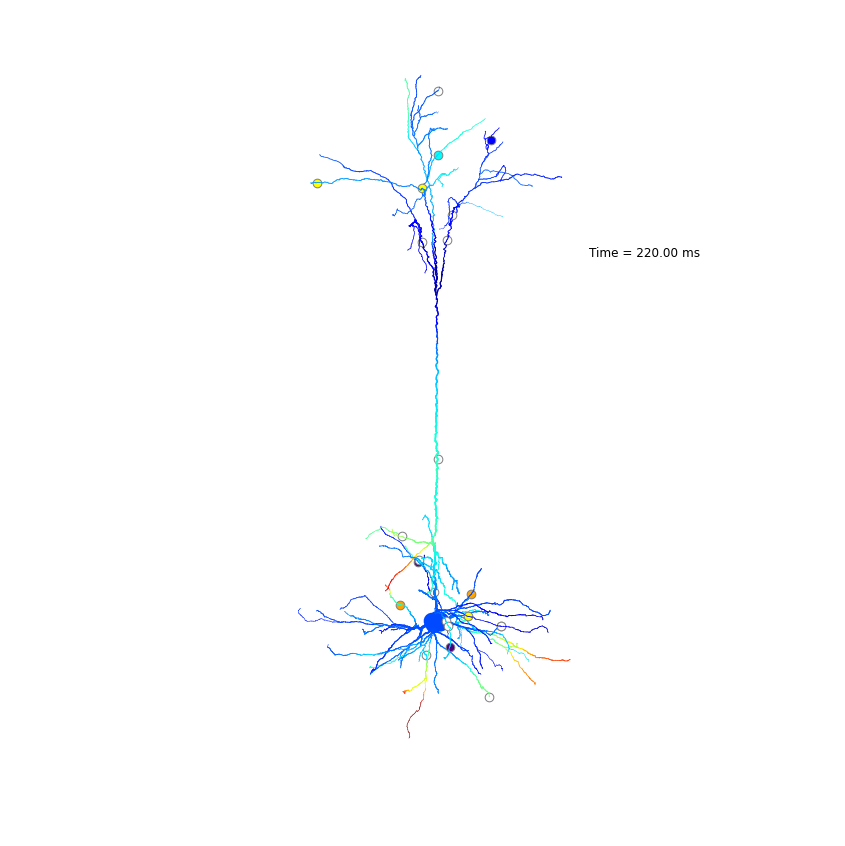
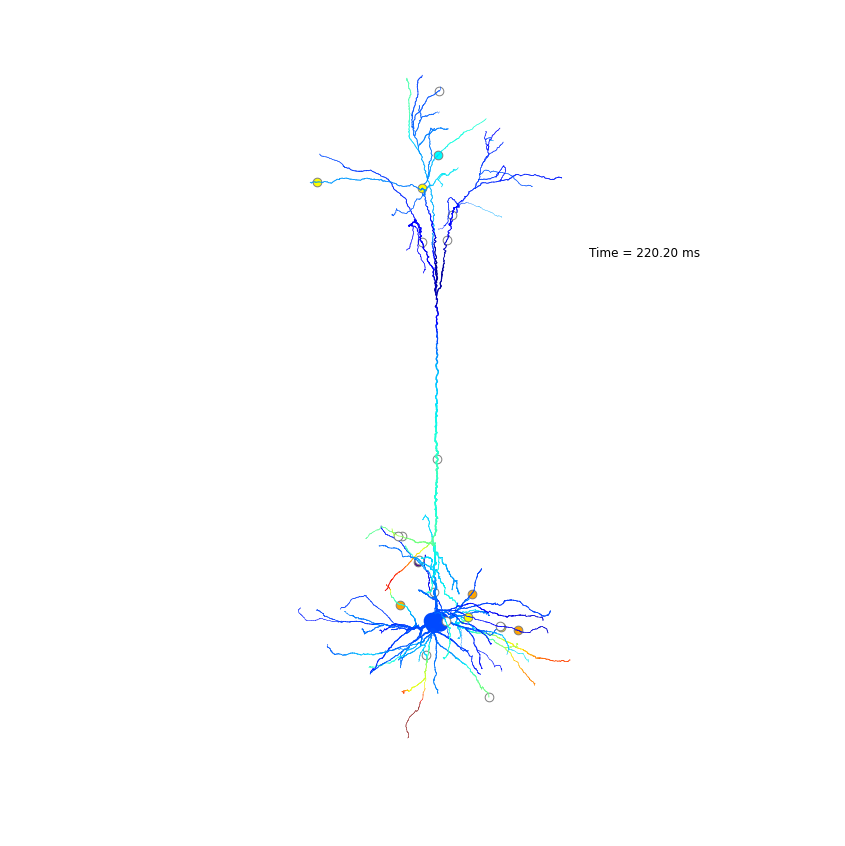
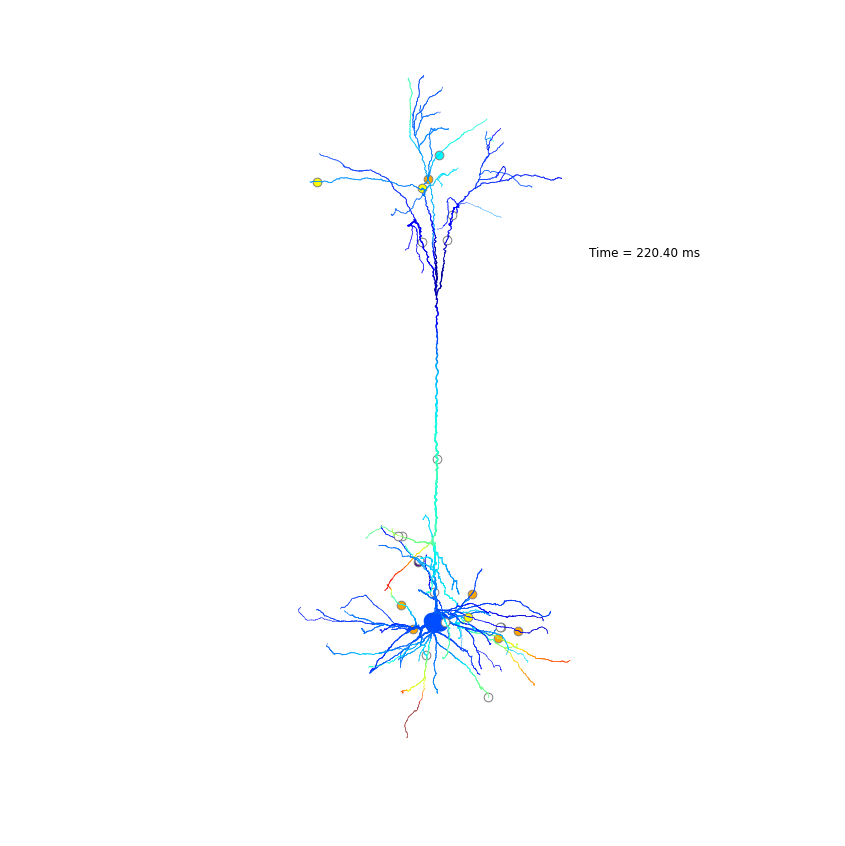
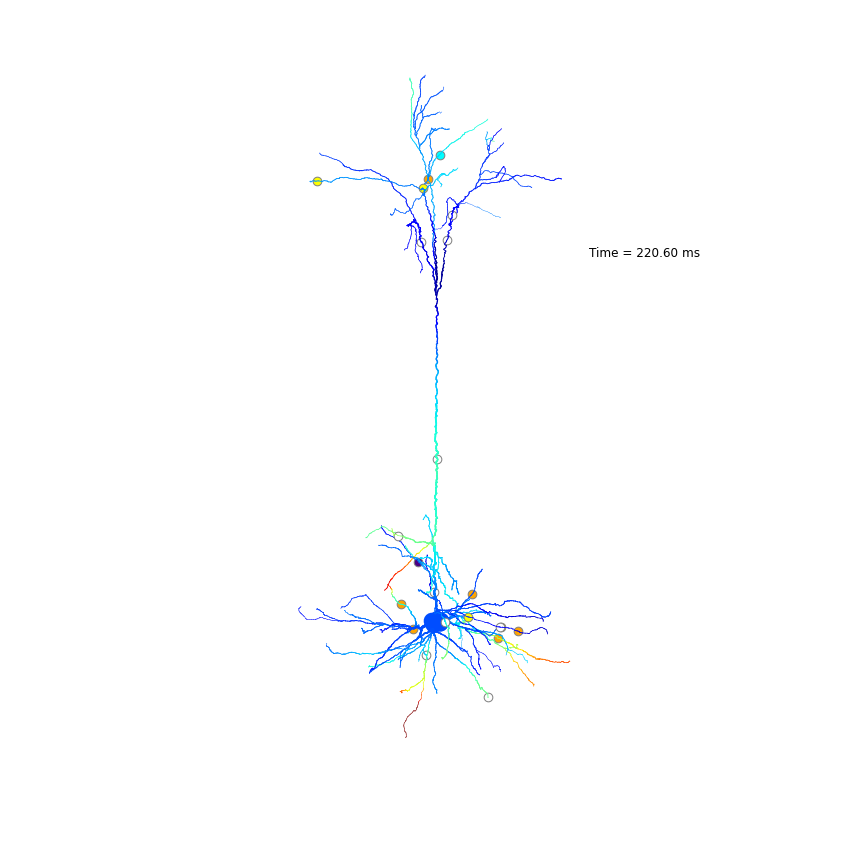
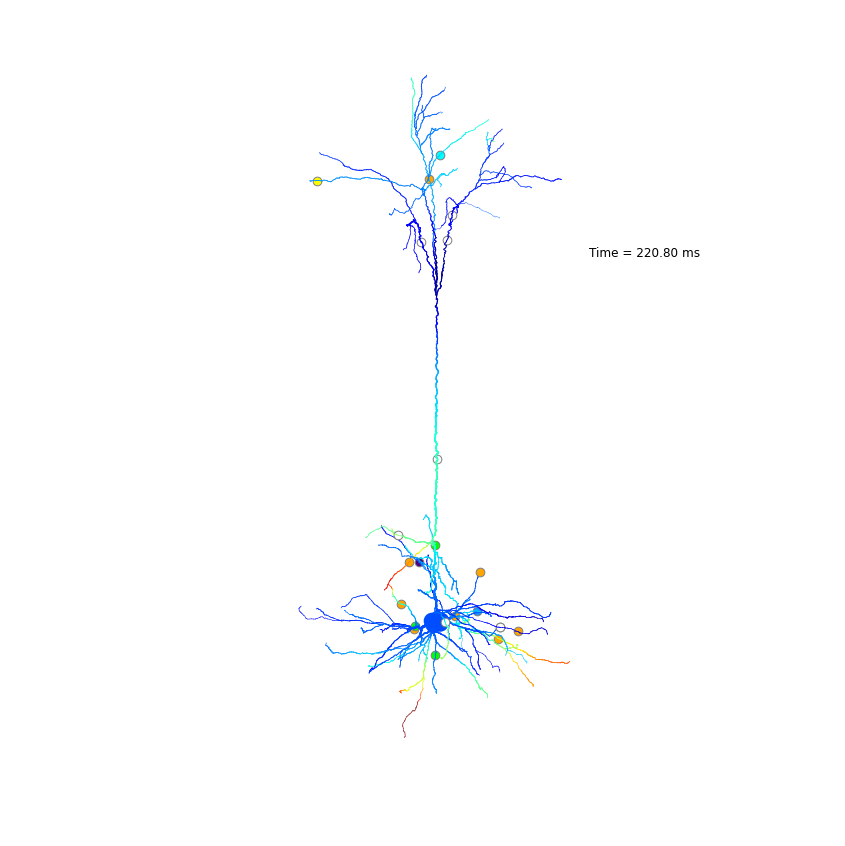
...
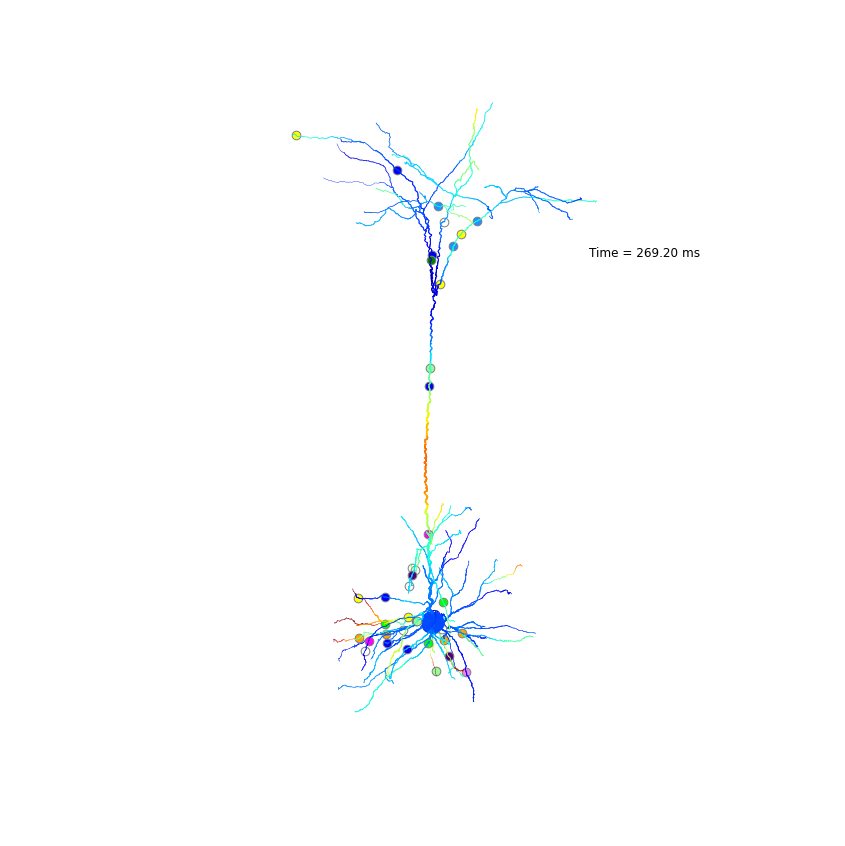
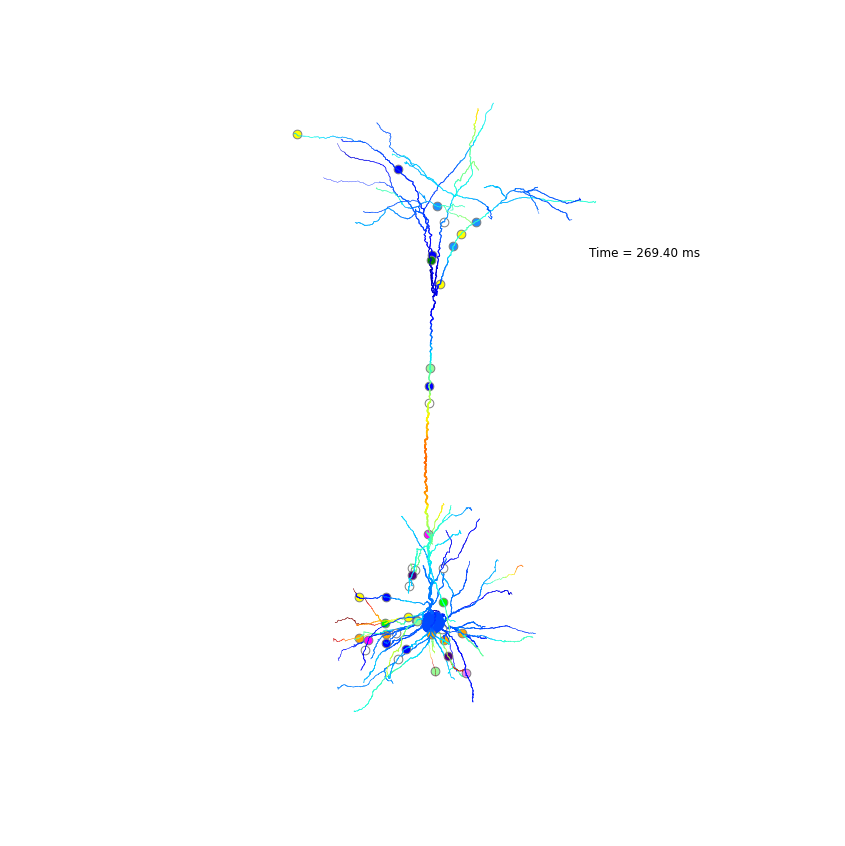
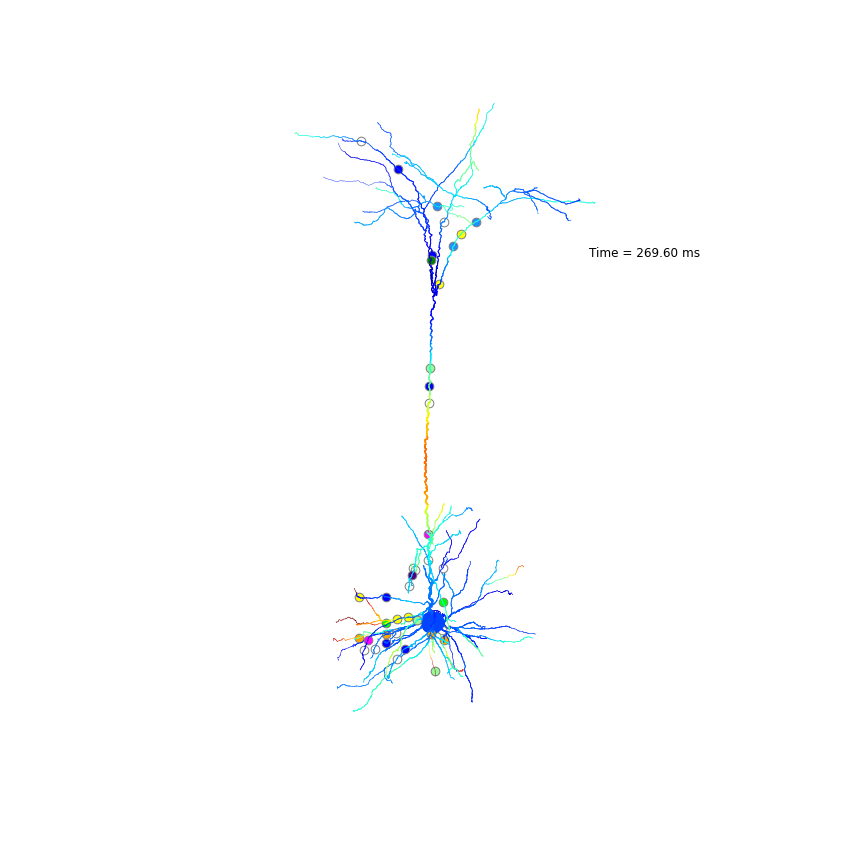
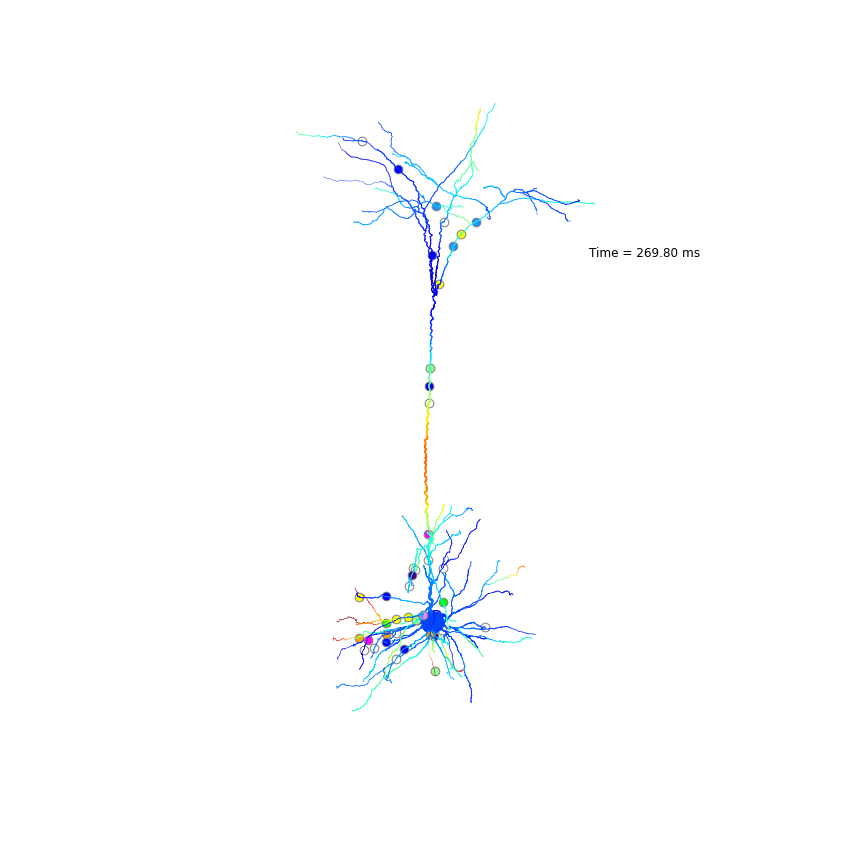
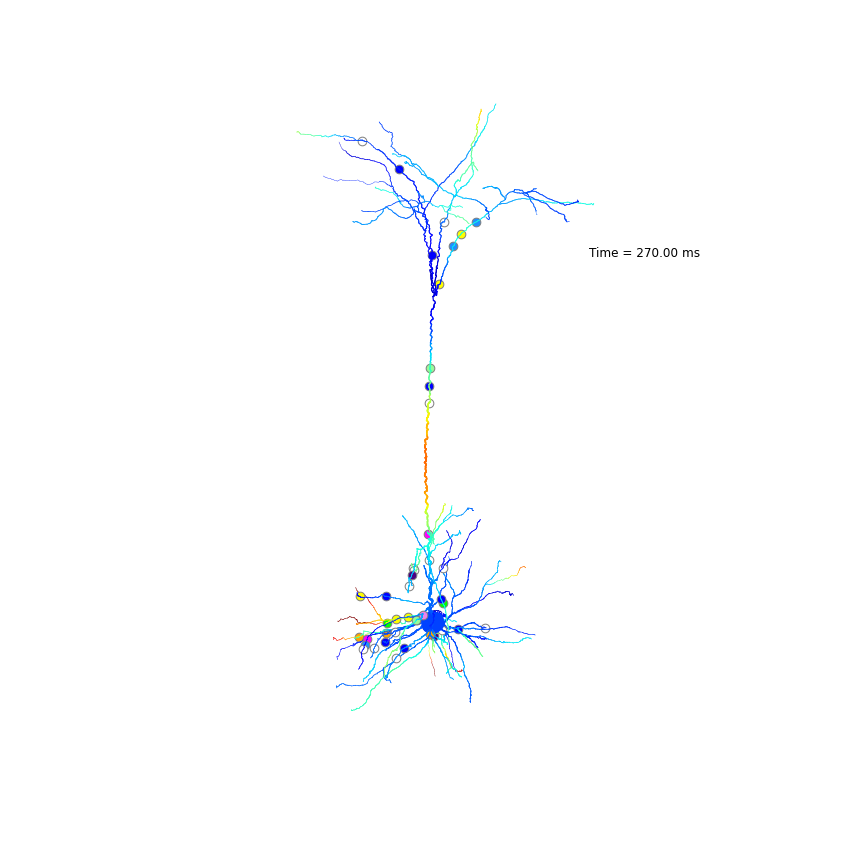

In [13]:
cmv = I.CellMorphologyVisualizer(cell)

# The synapse types in the .syn and .con files are of the form celltype_column
# We will color synapses according to the celltype, but not the column
sa = db["synapse_activation"]
unique_syn_types = I.np.unique(sa["synapse_type"])
population_to_color_dict = {'L1': 'cyan', 'L2': 'dodgerblue', 'L34': 'blue', 'L4py': 'palegreen',
                    'L4sp': 'green', 'L4ss': 'lime', 'L5st': 'yellow', 'L5tt': 'orange',
                    'L6cc': 'indigo', 'L6ccinv': 'violet', 'L6ct': 'magenta', 'VPM': 'black',
                    'INH': 'grey', 'EXC': 'red', 'all': 'black', 'PSTH': 'blue'}
for synapse_type in unique_syn_types:
    celltype = synapse_type.split('_')[0]
    if celltype not in population_to_color_dict: cmv.population_to_color_dict[synapse_type] = 'white'
    else: cmv.population_to_color_dict[synapse_type] = population_to_color_dict[synapse_type.split('_')[0]]
cmv.population_to_color_dict["inactive"] = "#f0f0f0"

images_path = str(db._basedir/'C2_stim_animation_3d')
cmv.animation(
    images_path=images_path, 
    color="voltage",
    show_synapses=True,
    client=dask_client,
    t_start=245-25, t_stop=245+25, t_step=0.2)

## Tutorials

For more information on how to create these parameterfiles, please consult the rest of the [tutorials](./tutorials).